In [57]:
# Install necessary requirements
# !pip install -r requirements

In [58]:
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import os
import random
import numpy as np
import cv2
import joblib
import helper_module
import itertools
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import ResNet50, VGG19, MobileNetV3Large, EfficientNetV2S, DenseNet121, ResNet50V2
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import models, layers, Model
from tensorflow.keras.layers import Lambda
from tensorflow.keras import backend as K
from sklearn.model_selection import train_test_split


Check if TPU is available

In [59]:
# Check if a TPU is available
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
    print("TPU detected and initialized.")
except ValueError:
    # No TPU found, specify GPU or CPU here
    use_gpu = True  # Set this to True to use GPU or False to use CPU
    if use_gpu and tf.config.list_physical_devices("GPU"):
        strategy = tf.distribute.MirroredStrategy()  # Use GPU
        print("Using GPU for TensorFlow computations.")
    else:
        strategy = tf.distribute.get_strategy()  # Use CPU
        print("Using CPU for TensorFlow computations.")

# Now you can define and run your TensorFlow model using the selected strategy

Using CPU for TensorFlow computations.


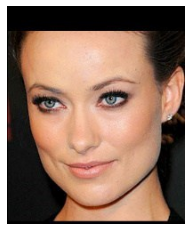

In [60]:
helper_module.show_img('dataset/train/left/abn.jpg')
train_pairing_df =helper_module.read_csv_to_df('dataset/train.csv')
test_candidates_df = helper_module.read_csv_to_df('dataset/test_candidates.csv')
# archive_images_df = helper_module.read_csv_to_df('archive/votes.csv')

1.  Create two data generator
    1.  Dissimilar_datagen to generate data thats not gonna be in the similar pair
    2.  Similar_datagen to generate data thats going tobe in the similar pair

-   The major difference between is for similar  ones, the only thing that can be augmented will be width and heigh shift range. But for dissimilar, it can be more diversed, thats because for similar images, any other augmentations can effect the quality of the similar pair.

In [61]:
train_datagen = ImageDataGenerator(
    rescale=1./255,         # Rescale pixel values to [0, 1]
    rotation_range=20,      # Randomly rotate images by up to 20 degrees
    width_shift_range=0.2,  # Randomly shift image width by up to 20%
    height_shift_range=0.2, # Randomly shift image height by up to 20%
    shear_range=0.2,        # Shear transformations
    zoom_range=0.2,         # Randomly zoom in on images by up to 20%
    horizontal_flip =True,   # Randomly flip images horizontally
    vertical_flip = False,
    fill_mode='nearest'     # Fill mode for newly created pixels
)


# similar_datagen = ImageDataGenerator(
#     rescale=1./255,            # Rescale pixel values to [0, 1]
#     rotation_range=20,         # Randomly rotate images by up to 20 degrees
#     width_shift_range=0.2,     # Randomly shift image width by up to 20%
#     height_shift_range=0.2,    # Randomly shift image height by up to 20%
#     shear_range=0.2,           # Shear transformations
#     zoom_range=0.2,            # Randomly zoom in/out on images by up to 20%
#     horizontal_flip=True,      # Randomly flip images horizontally
#     vertical_flip=False,       # Do not flip vertically
#     fill_mode='nearest'        # Fill mode for newly created pixels
# )

Now Pair up the left and right image
1. The Data format will be  [Left,Right] this will be a pair of similar image
2. The load_and_preprocess_image takes in the image_path, and load and preproceess image with specifc data generator based on randon_transform.
3. The create_train_valid_pair takes in the Boolean value and create dataset of valid pairs of similar images.
4. The create_train_valid_pair_archive does the same but with external dataset


In [62]:
def load_and_preprocess_image(image_path,  datagen = None, target_size=(224,224), random_transform=False):
    # Open the image using Pillow (PIL)
    img = load_img(image_path, target_size=target_size)

    img = img.resize(target_size)

    img = img_to_array(img, dtype='uint8')


    if random_transform:
        img = datagen.random_transform(img)

    return img

def create_train_valid_pair(random_transform):
    # Create a list to store the dataset
    dataset = []

    # Iterate through the rows of the CSV file and load/preprocess the images
    for index, row in train_pairing_df.iterrows():
        left_image = load_and_preprocess_image(f"dataset/train/left/{row['left']}.jpg", train_datagen, random_transform=random_transform)

        # Load and preprocess similar image
        similar_image = load_and_preprocess_image(f"dataset/train/right/{row['right']}.jpg", train_datagen, random_transform=random_transform)

        # Create a data entry containing the left image, list of right images, and the index of the similar image
        data_entry = [left_image, similar_image]
        dataset.append(data_entry)

    return dataset



In [63]:
# def create_train_valid_pair_with_two_similar():
#     # Create a list to store the dataset
#     dataset = []

#     # Iterate through the rows of the CSV file and load/preprocess the images
#     for index, row in train_pairing_df.iterrows():
#         left_image = load_and_preprocess_image(f"dataset/train/left/{row['left']}.jpg", similar_datagen, random_transform=False)

#         # Load and preprocess similar image
#         similar_image = load_and_preprocess_image(f"dataset/train/right/{row['right']}.jpg", similar_datagen, random_transform=False)
#         transformed_similar_image = load_and_preprocess_image(f"dataset/train/right/{row['right']}.jpg", similar_datagen, random_transform=True)
#         # Create a data entry containing the left image, list of right images, and the index of the similar image
#         data_entry = [left_image, similar_image, transformed_similar_image]
#         dataset.append(data_entry)

#     return dataset



Pair up images with similar images and try to save them in the current working directory so it can be resued later even after restart of the kernel

In [64]:
def display_image_pair(image_pair):
    plt.figure(figsize=(8, 4))
    
    # Display the left image
    plt.subplot(1, 2, 1)
    plt.imshow(image_pair[0])
    plt.title('Left Image')
    plt.axis('off')
    
    # Display the right image
    plt.subplot(1, 2, 2)
    plt.imshow(image_pair[1])
    plt.title('Right Image')
    plt.axis('off')
    
    plt.show()

def create_and_save_combined_dataset():
    train_valid_offical_pair_dataset = create_train_valid_pair(False)
    # Save data
    joblib.dump(train_valid_offical_pair_dataset, 'train_valid_offical_pair_dataset.joblib')

# def create_and_save_combined_dataset_with_two_similar():
#     train_valid_offical_pair_dataset_with_two_similar = create_train_valid_pair_with_two_similar()
#     # Save data
#     joblib.dump(train_valid_offical_pair_dataset_with_two_similar, 'train_valid_offical_pair_dataset_with_two_similar.joblib')
    

In [65]:
# Try to load the dataset
try:
    train_valid_offical_pair_dataset = joblib.load('train_valid_offical_pair_dataset.joblib')

    print(f"Loaded train_valid_offical_pair_dataset size is {len(train_valid_offical_pair_dataset)}")

except FileNotFoundError:
    print("Dataset not found, creating and saving...")
    create_and_save_combined_dataset()
    train_valid_offical_pair_dataset = joblib.load('train_valid_offical_pair_dataset.joblib')
    print(f"Created and saved train_valid_offical_pair_dataset size is {len(train_valid_offical_pair_dataset)}")

train_valid_dataset = train_valid_offical_pair_dataset
print(f"train_valid_dataset size is {len(train_valid_dataset)}")

Loaded train_valid_offical_pair_dataset size is 2000
train_valid_dataset size is 2000


In [66]:
# Try to load the dataset
try:

    train_valid_offical_pair_dataset_with_two_similar = joblib.load('train_valid_offical_pair_dataset_with_two_similar.joblib')

    print(f"Loaded train_valid_offical_pair_dataset size is {len(train_valid_offical_pair_dataset_with_two_similar)}")
except FileNotFoundError:
    print("Dataset not found, creating and saving...")
    # create_and_save_combined_dataset_with_two_similar()
    # train_valid_offical_pair_dataset_with_two_similar = joblib.load('train_valid_offical_pair_dataset_with_two_similar.joblib')
    # print(f"Created and saved train_valid_offical_pair_dataset size is {len(train_valid_offical_pair_dataset_with_two_similar)}")

# train_valid_dataset_with_two_similar = train_valid_offical_pair_dataset_with_two_similar
# print(f"train_valid_dataset size is {len(train_valid_dataset_with_two_similar)}")

Dataset not found, creating and saving...


To display image pairs and also showing some matched features

2


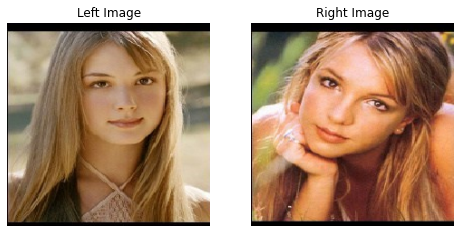

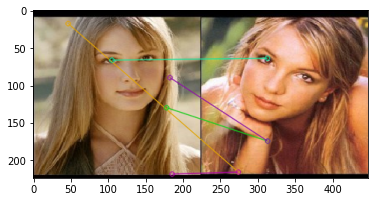

In [67]:
# Now you have the dataset loaded or created, and you can work with it as needed.
print(len(train_valid_dataset[100]))
display_image_pair(train_valid_dataset[100])

orb = cv2.ORB_create()
sift = cv2.SIFT_create()

# show_local_features(sift,train_valid_dataset[5][0][0])
helper_module.draw_image_matches(sift, train_valid_dataset[100])

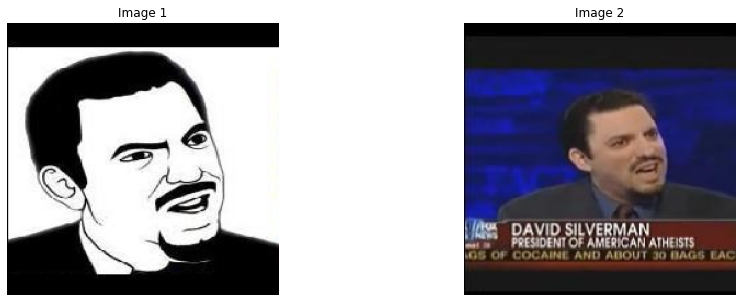

In [68]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

for i in range(2):
    ax = axes[i]
    ax.imshow(train_valid_offical_pair_dataset[20][i])
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.show()

We also need to combine all images together into a dataset in order to select randomly in this pool

In [69]:
def load_images_from_folder(folder_path, datagen, random_transform):
    image_list = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):  # Add more conditions for other image formats
            img = load_and_preprocess_image(os.path.join(folder_path, filename), datagen=datagen, random_transform=random_transform)
            image_list.append(img)
    return np.array(image_list)

official_right_folder_path = "dataset/train/right"
official_left_folder_path = "dataset/train/left"

outside_right_folder_path = "archive/right/right"
outside_left_folder_path = "archive/left/left"

try:
    official_right_images = joblib.load('official_right_images.joblib')
    official_left_images = joblib.load('official_left_images.joblib')
    
except FileNotFoundError:

    official_right_images = load_images_from_folder(official_right_folder_path,train_datagen,True)
    official_left_images = load_images_from_folder(official_left_folder_path,train_datagen,True)

    # Save to disk
    joblib.dump(official_right_images, 'official_right_images.joblib')
    joblib.dump(official_left_images, 'official_left_images.joblib')

image_pool = np.concatenate([official_right_images, official_left_images])

print(f"there are {len(image_pool)} images in image pool each with shape {image_pool[0].shape}")

there are 4000 images in image pool each with shape (224, 224, 3)


In [70]:
# try:
#     official_right_images_non_aug = joblib.load('official_right_images_non_aug.joblib')
#     official_left_images_non_aug = joblib.load('official_left_images_non_aug.joblib')
    
# except FileNotFoundError:

#     official_right_images_non_aug = load_images_from_folder(official_right_folder_path,train_datagen,False)
#     official_left_images_non_aug = load_images_from_folder(official_left_folder_path,train_datagen,False)

#     # Save to disk
#     joblib.dump(official_right_images_non_aug, 'official_right_images_non_aug.joblib')
#     joblib.dump(official_left_images_non_aug, 'official_left_images_non_aug.joblib')

# image_pool_non_aug = np.concatenate([official_right_images_non_aug, official_left_images_non_aug])

# print(f"there are {len(image_pool_non_aug)} images in image pool each with shape {image_pool_non_aug[0].shape}")

Functions for pick random images from pool 

In [71]:
def pick_random_images(image_pool, num_images):
    """
    Pick a specific number of random images from a given image pool.

    Parameters:
    - image_pool (numpy array): The array containing all the images.
    - num_images (int): The number of random images to pick.

    Returns:
    - random_images (numpy array): Array containing the random images picked.
    """

    # Make sure the image pool has enough images to pick from
    if len(image_pool) < num_images:
        raise ValueError("The image pool contains fewer images than requested.")

    # Randomly pick indices
    random_indices = np.random.choice(len(image_pool), num_images, replace=False)
    
    # Get the random images
    random_images = image_pool[random_indices]
    
    return random_images

def show_images(images, ncols=5):
    """
    Show multiple images in a grid.

    Parameters:
    - images (numpy array): The array containing all the images to show.
    - ncols (int): Number of columns in the grid.
    """

    n_images = len(images)
    n_rows = int(np.ceil(n_images / ncols))

    fig, axes = plt.subplots(nrows=n_rows, ncols=ncols, figsize=(15, 15))
    
    # Flatten the axes in case it's multi-dimensional
    axes = axes.flatten()

    for i in range(n_images):
        ax = axes[i]
        ax.imshow(images[i].astype('uint8'))
        ax.axis('off')
    
    # Hide any remaining empty subplots
    for i in range(n_images, len(axes)):
        axes[i].axis('off')

    plt.show()

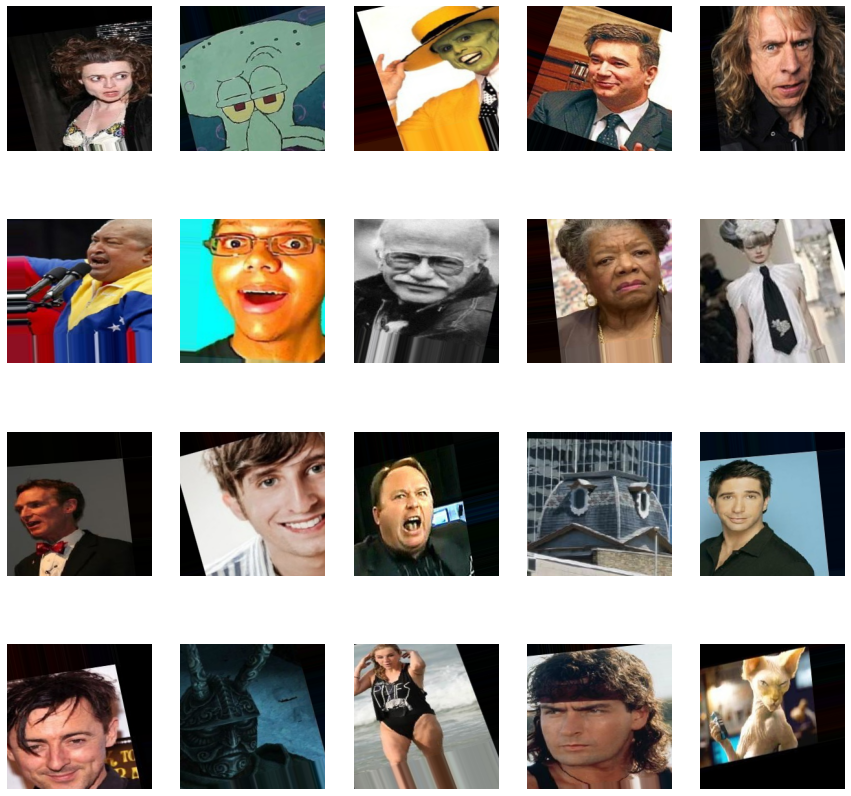

Picked 20 random images.


In [72]:
num_images_to_pick = 20  # The number of random images you want
random_images = pick_random_images(image_pool, num_images_to_pick)
# Show the random images
show_images(random_images)
print(f"Picked {len(random_images)} random images.")

Create model

In [73]:
def create_siamese_with_model(input_shape, base_model, num_right_inputs=1):
   
    input_left = tf.keras.layers.Input(shape=input_shape, name="left_input")
    input_right_list = tf.keras.layers.Input(shape=(num_right_inputs,) + input_shape, name="right_input")

    
    # Split and reshape the right input images
    split_right_inputs = Lambda(lambda x: [tf.squeeze(split, axis=1) for split in tf.split(x, num_or_size_splits=num_right_inputs, axis=1)])(input_right_list)
    
    embedding = create_embedding_model(input_shape, base_model)

    output_left = embedding(input_left)
    output_right_list = [embedding(right_input) for right_input in split_right_inputs]

    # Calculate similarity scores (cosine similarity)
    raw_similarity_scores = [layers.Dot(axes=-1, normalize=True)([output_left, right]) for right in output_right_list]
    
    # Convert raw similarity scores to [0, 1] range
    adjusted_similarity_scores = [Lambda(lambda x: (1 + x) / 2)(raw_score) for raw_score in raw_similarity_scores]

    # Concatenate similarity scores
    concatenated = layers.Concatenate(axis=1, name="similarity_scores")(adjusted_similarity_scores)

    siamese_model = models.Model(inputs=[input_left, input_right_list], outputs=concatenated)

    return siamese_model

def create_embedding_model(input_shape, base_model):
    input_image = tf.keras.layers.Input(shape=input_shape)
    features = base_model(input_image)

    flatten = layers.Flatten()(features)

    dense1 = layers.Dense(1024, activation="relu")(flatten)
    dense1 = layers.BatchNormalization()(dense1)
    # dense1 = layers.LayerNormalization()(dense1)
    dense1 = layers.Dropout(0.5)(dense1)

    output = layers.Dense(256)(dense1)  # Final embedding size of 128

    embedding = models.Model(input_image, output, name="Embedding")

    return embedding

To find out the performance of each different pretrained models

1.  The idea is to generate a set with 1 left image and 20 right images which contains one similar image. The input format will be [left,[right1,right2,right3...]The similar image will always be on index 0.

In [74]:
extract_model = VGG19(
    weights="imagenet",
    input_shape=(224, 224, 3),
    include_top=False,
)
def get_image_feature_vector(img):
    """Get the feature vector for an image."""
    img = np.expand_dims(img, axis=0).copy()
    img = preprocess_input(img)
    features = extract_model.predict(img,verbose = 0)
    return features.flatten()

def cosine_similarity(image1, image2):
    """Calculate cosine similarity between two images."""
    img1_vector = get_image_feature_vector(image1)
    img2_vector = get_image_feature_vector(image2)
    
    dot_product = np.dot(img1_vector, img2_vector)
    norm1 = np.linalg.norm(img1_vector)
    norm2 = np.linalg.norm(img2_vector)
    
    cosine_sim = dot_product / (norm1 * norm2)
    
    # Adjust the range from [-1, 1] to [0, 1]
    adjusted_cosine_sim = (1 + cosine_sim) / 2
    
    return adjusted_cosine_sim

def pick_20_images(left_image, right_images, threshold=0.6, required_challenging_image=2):
    top_images = []
    to_remove = []

    # Iterate through each right image to calculate similarity score
    for idx, right_image in enumerate(right_images):
        similarity = cosine_similarity(left_image, right_image)
        if similarity >= threshold:
            top_images.append(right_image)
            to_remove.append(idx)
            # Stop if we've found the required number of challenging images
            if len(top_images) >= required_challenging_image:
                break

    # Remove selected images from right_images
    right_images = np.delete(right_images, to_remove, axis=0)
    
    # If no top_images are found
    if len(top_images) == 0:
        top_images = right_images[:19]
    else:
        # Select remaining images to make it 20
        remaining_needed = 19 - len(top_images)
        remaining_images = right_images[:remaining_needed]
        
        # Concatenate both to have exactly 20 images
        top_images = np.concatenate((top_images, remaining_images), axis=0)

    return top_images

def show_images_with_left(left_image, right_images):
    fig, axes = plt.subplots(1, len(right_images) + 1, figsize=(20, 20))
    
    # Show the left image
    axes[0].imshow(left_image.numpy().astype('uint8'))
    axes[0].set_title("Left Image")
    axes[0].axis('off')

    
    # Show the top 20 right images
    for i, img in enumerate(right_images):
        axes[i + 1].imshow(img.numpy().astype('uint8'))
        axes[i + 1].set_title(f"Right {i+1}")
        axes[i + 1].axis('off')

    plt.show()

In [75]:
def generator(pair_list,number_of_right_images=19):
    for pair in pair_list:
        left_image, similar_image = pair[0], pair[1]
        # Get 100 random images from right_official_images
        right_images_list = [similar_image]
        random_dissimilar_images = pick_random_images(image_pool,50)
        # pick the most similar 20 images 
        picked_20_images = pick_20_images(left_image,random_dissimilar_images)
        
        right_images_array = np.concatenate([right_images_list,picked_20_images])
      
        if right_images_array.shape == (20, 224, 224, 3):
            label = [1] + [0] * 19 # Create labels dynamically
            yield (preprocess_input(left_image), preprocess_input(right_images_array)), label
        else:
            print(f"Skipped due to shape mismatch shape is {right_images_array.shape}")
            return

def create_dataset(pair_list,batch_size,number_of_right_images = 19):
    output_signature = (
        (tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(20, 224, 224, 3), dtype=tf.float32)),
        tf.TensorSpec(shape=(20,), dtype=tf.int32))
        
    return tf.data.Dataset.from_generator(
        lambda: generator(pair_list,number_of_right_images), 
        output_signature=output_signature
    ).batch(batch_size).repeat().prefetch(tf.data.experimental.AUTOTUNE)


Custom contrastive loss function

In [76]:
def custom_contrastive_loss(Y_true, D):
    margin = 1.0  # Hyperparameter, you can tune this
    true_score = D[:, 0]
    negative_scores = D[:, 1:]
    highest_negative = K.max(negative_scores, axis=1)
    loss = K.maximum(0.0, highest_negative - true_score + margin)
    return K.mean(loss)

Average cosine similarity is 0.6298
So we set the threshhold to 0.58

In [77]:
# # Initialize the sum to zero
# sum_similarity = 0

# # Assume train_pairs is a list of pairs, where each pair contains two NumPy arrays
# # train_pairs = [(array1, array2), (array3, array4), ...]

# for pair in train_pairs:
#     similarity = cosine_similarity(pair[0], pair[1])
#     sum_similarity += similarity

# # Calculate the average similarity
# average_similarity = sum_similarity / len(train_pairs)

# print("Average Cosine Similarity:", average_similarity)

Shape of left_images: (1, 224, 224, 3)
Shape of right_images_list: (1, 20, 224, 224, 3)
Shape of labels: (1, 20)


<ipython-input-74-8182250b6320>:63: RuntimeWarning: invalid value encountered in cast
  axes[0].imshow(left_image.numpy().astype('uint8'))
<ipython-input-74-8182250b6320>:70: RuntimeWarning: invalid value encountered in cast
  axes[i + 1].imshow(img.numpy().astype('uint8'))


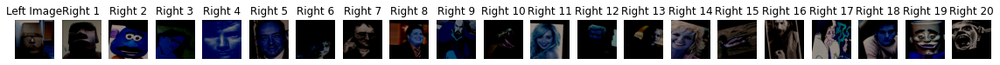

In [78]:
number_of_right_images = 20
batch_size = 1
# Split the dataset into training and validation sets (e.g., 80% for training, 20% for validation)
train_pairs, valid_pairs = train_test_split(train_valid_dataset, test_size=0.2, random_state=42)

train_dataset = create_dataset(train_pairs, batch_size, number_of_right_images-1)
valid_dataset = create_dataset(valid_pairs, batch_size, number_of_right_images-1)



# Inspect one batch from the training dataset
for one_batch in train_dataset.take(1):
    (left_images, right_images_list), labels = one_batch
    print("Shape of left_images:", left_images.shape)
    print("Shape of right_images_list:", right_images_list.shape)
    print("Shape of labels:", labels.shape)
    show_images_with_left(left_images[0], right_images_list[0])

In [79]:
with strategy.scope():
    # Split the dataset into training and validation sets (e.g., 80% for training, 20% for validation)
    train_pairs, valid_pairs = train_test_split(train_valid_dataset, test_size=0.2, random_state=42)

    print(f"training pair size {len(train_pairs)}, validation size {len(valid_pairs)}")
    num_epochs = 20 # Adjust the number of epochs as needed
    batch_size = 128  # Adjust the batch size as needed
    number_of_right_images = 20 # consists of one similar image and 19 random images 
    input_shape = (224, 224, 3)
    
    ResNet50_before_transfer = 'ResNet50_before_transfer.keras'

    VGG19_before_transfer = 'VGG19_before_transfer.keras'
    
    MobileNetV3Large_before_transfer  = 'MobileNetV3Large_before_transfer.keras'

    EfficientNetV2S_before_transfer = 'EfficientNetV2S_before_transfer.keras'


    chose_model = VGG19_before_transfer
    # Create datasets
    train_dataset = create_dataset(train_pairs, batch_size, number_of_right_images-1)
    valid_dataset = create_dataset(valid_pairs, batch_size, number_of_right_images-1)

    # Inspect one batch from the training dataset
    for one_batch in train_dataset.take(1):
        (left_images, right_images_list), labels = one_batch
        print("Shape of left_images:", left_images.shape)
        print("Shape of right_images_list:", right_images_list.shape)
        print("Shape of labels:", labels.shape)

    try:
        siamese_model = tf.keras.models.load_model(chose_model,custom_objects={'custom_contrastive_loss': custom_contrastive_loss},safe_mode=False)
        siamese_model.summary()
    except Exception as e:
        print("Error during model loading:", str(e))
        VGG19_model = VGG19(
            weights="imagenet",
            input_shape=input_shape,
            include_top=False,
        )

        ResNet50_model = ResNet50(
            weights="imagenet",
            input_shape=input_shape,
            include_top=False,
        )

        MobileNetV3Large_model = MobileNetV3Large(
            weights="imagenet",
            input_shape=input_shape,
            include_top=False,
        )

        EfficientNetV2S_model = EfficientNetV2S(
            weights="imagenet",
            input_shape=input_shape,
            include_top=False,
        )


        EfficientNetV2S_model.trainable = False
        ResNet50_model.trainable = False
        MobileNetV3Large_model.trainable = False
        VGG19_model.trainable = False
        # Create the Siamese network
        siamese_model = create_siamese_with_model(input_shape,base_model= VGG19_model,num_right_inputs=number_of_right_images)
        # Compile the model
        siamese_model.compile(loss=custom_contrastive_loss, optimizer=Adam(0.0001), metrics=[tf.keras.metrics.TopKCategoricalAccuracy(k=1)])
        siamese_model.summary()

        try:
            history = siamese_model.fit(
                x=train_dataset,
                steps_per_epoch=len(train_pairs) // batch_size,
                validation_data=valid_dataset,
                validation_steps=len(valid_pairs) // batch_size,
                epochs=num_epochs,
            )
            siamese_model.save(chose_model)
        except Exception as e:
            print("Error during training:", str(e))
    
    siamese_model.evaluate(valid_dataset,batch_size=128,steps=len(valid_pairs) // batch_size)



training pair size 1600, validation size 400


KeyboardInterrupt: 

In [ ]:
# VGG19_test = VGG19(
#         weights="imagenet",
#         input_shape=input_shape,
#         include_top=False,
#     )

# print(VGG19_test.summary())

- Transfer learning
- Now we need to unfreeze some of the layers in the base model and try to get better at accuracy
- But we need to keep the learning rate very very low to keep the weights stable

In [ ]:
# with strategy.scope():
#     # Unfreeze the last MBConv block
#     # Access the 'Embedding' layer
#     batch_size = 10
#     train_pairs_with_two_similar, valid_pairs_with_two_similar = train_test_split(train_valid_dataset_with_two_similar, test_size=0.2, random_state=42)
    
#     train_dataset_with_two_similar = create_dataset(train_pairs_with_two_similar, batch_size, number_of_right_images-2)
#     valid_dataset_with_two_similar = create_dataset(valid_pairs_with_two_similar, batch_size, number_of_right_images-2)
#     # Inspect one batch from the training dataset
#     for one_batch in train_dataset_with_two_similar.take(1):
#         (left_images, right_images_list), labels = one_batch
#         print("Shape of left_images:", left_images.shape)
#         print("Shape of right_images_list:", right_images_list.shape)
#         print("Shape of labels:", labels.shape)

#     embedding_layer = siamese_model.get_layer('Embedding')

#     # Access the base model within 'Embedding'
#     base_model = embedding_layer.get_layer('vgg19') 
#     # base_model.trainable = True
#     base_model.trainable = True
#     # for layer in base_model.layers:
#     #     if 'block5' in layer.name or 'block4' in layer.name:  # unfreeze certain blocks
#     #         layer.trainable = True
#     #     if layer.trainable == True:
#     #         print(layer.name)
#     siamese_model.compile(loss=custom_contrastive_loss, optimizer=Adam(0.00000001), metrics=[tf.keras.metrics.TopKCategoricalAccuracy(k=1)])
#     siamese_model.summary()

In [ ]:
# num_epochs = 10
# try:
#     history = siamese_model.fit(
#         x=train_dataset_with_two_similar,
#         steps_per_epoch=len(train_pairs_with_two_similar) // batch_size,
#         validation_data=valid_dataset_with_two_similar,
#         validation_steps=len(valid_pairs_with_two_similar) // batch_size,
#         epochs=num_epochs,
#     )
# except Exception as e:
#     print("Error during training:", str(e))

In [ ]:
# siamese_model.evaluate(valid_dataset,batch_size=128,steps=len(valid_pairs) // batch_size)

functions for showing test_case and get test result

In [ ]:
import math

def show_test_case(model, test_candidates_df, row_number=10):
    for index, row in test_candidates_df.iterrows():
        if index >= row_number:
            break

        left_image = None
        right_images = []

        for column, value in row.items():
            if column == 'left':
                left_image = load_and_preprocess_image(f"dataset/test/left/{value}.jpg")
            else:
                test_img_right = load_and_preprocess_image(f"dataset/test/right/{value}.jpg")
                right_images.append(test_img_right)

        # Convert to NumPy arrays
        left_image = np.array([left_image])
        right_images = np.array([right_images])

         # Run prediction
        try:
            similarity_scores = model.predict([left_image, right_images], verbose=0)[0]
            print("Similarity Scores:", similarity_scores)
        except Exception as e:
            print("An error occurred during prediction:", e)

        # Identify the highest score
        highest_score_idx = np.argmax(similarity_scores)

        # Plot images
        num_rows = math.ceil((len(right_images[0]) + 1) / 10)
        fig, axes = plt.subplots(num_rows, 10, figsize=(20, 5 * num_rows))

        # Show left image
        if num_rows > 1:
            axes[0, 0].imshow(left_image[0])
            axes[0, 0].set_title("Left Image")
            axes[0, 0].axis('off')
        else:
            axes[0].imshow(left_image[0])
            axes[0].set_title("Left Image")
            axes[0].axis('off')

        # Show right images
        for i in range(len(right_images[0])):
            row_idx = (i + 1) // 10
            col_idx = (i + 1) % 10
            title = f"Right {i+1}\nScore: {similarity_scores[i]:.2f}"
            
            if i == highest_score_idx:
                title += "\nSimilar"

            if num_rows > 1:
                axes[row_idx, col_idx].imshow(right_images[0][i])
                axes[row_idx, col_idx].set_title(title)
                axes[row_idx, col_idx].axis('off')
            else:
                axes[col_idx].imshow(right_images[0][i])
                axes[col_idx].set_title(title)
                axes[col_idx].axis('off')

        plt.show()
    
def get_test_result(model, test_data, output_df, file_name):
    for index, row in test_candidates_df.iterrows():
        print(f"Row {index}")

        left_image = None
        right_images = []

        row_name = None  # Placeholder for the value in the 'left' column

        for column, value in row.items():
            if column == 'left':
                row_name = value
                left_image = load_and_preprocess_image(f"dataset/test/left/{value}.jpg")
            else:
                test_img_right = load_and_preprocess_image(f"dataset/test/right/{value}.jpg")
                right_images.append(test_img_right)

        # Convert to NumPy arrays
        left_image = np.array([left_image])
        right_images = np.array([right_images])

        # Run prediction
        
        similarity_scores = model.predict([left_image, right_images], verbose=0)[0]

        # Add to DataFrame
        new_row = {'left': row_name}
        for i, score in enumerate(similarity_scores):
            new_row[f"c{i}"] = score

        output_df.loc[len(output_df)] = new_row

    # Save the DataFrame to a CSV file
    output_df.to_csv(file_name, index=False)



2023-10-01 07:38:48.478336: I tensorflow/core/tpu/graph_rewrite/encapsulate_tpu_computations_pass.cc:238] Subgraph fingerprint:1122013109471936659
2023-10-01 07:39:04.856467: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-10-01 07:39:10.796642: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-10-01 07:39:21.520194: I tensorflow/core/tpu/kernels/tpu_compilation_cache_interface.cc:437] TPU host compilation cache miss: cache_key(9405475729526150029:0:0), session_name()
2023-10-01 07:40:49.456926: I tensorflow/core/tpu/kernels/tpu_compile_op_common.cc:221] Compilation of 9405475729526150029:0:0 with session name  took 1m27.936634227s and succeeded
2023-10-01 07:40:49.995517: I tensorflow/core/tpu/kernels/tpu_compilation_cache_interface.cc:471] TPU host compilation

Similarity Scores: [0.60158706 0.5728021  0.6012633  0.44475043 0.3862187  0.54045916
 0.4739372  0.5333643  0.5753561  0.55683947 0.43902957 0.5547493
 0.5798478  0.5511874  0.66291654 0.57893956 0.67932266 0.51235276
 0.798425   0.6359761 ]


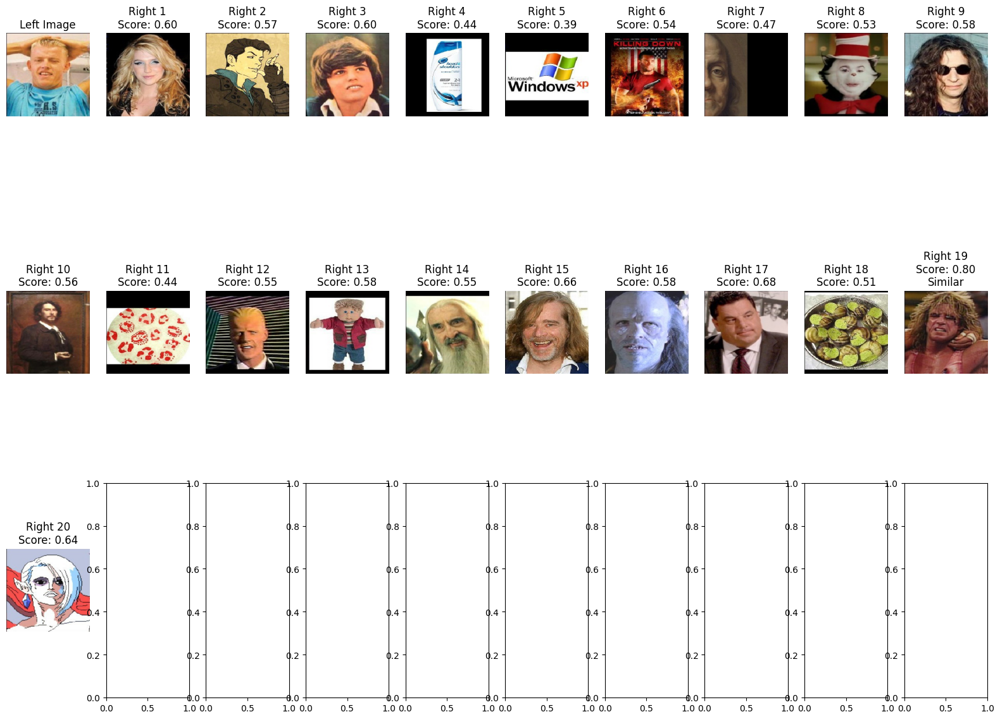

Similarity Scores: [0.6575912  0.4664215  0.72773623 0.50004584 0.61773086 0.60116184
 0.4629431  0.7145466  0.60118276 0.539791   0.5017546  0.6065228
 0.5559236  0.6212971  0.5426945  0.6557661  0.62355626 0.47059014
 0.6222756  0.6488795 ]


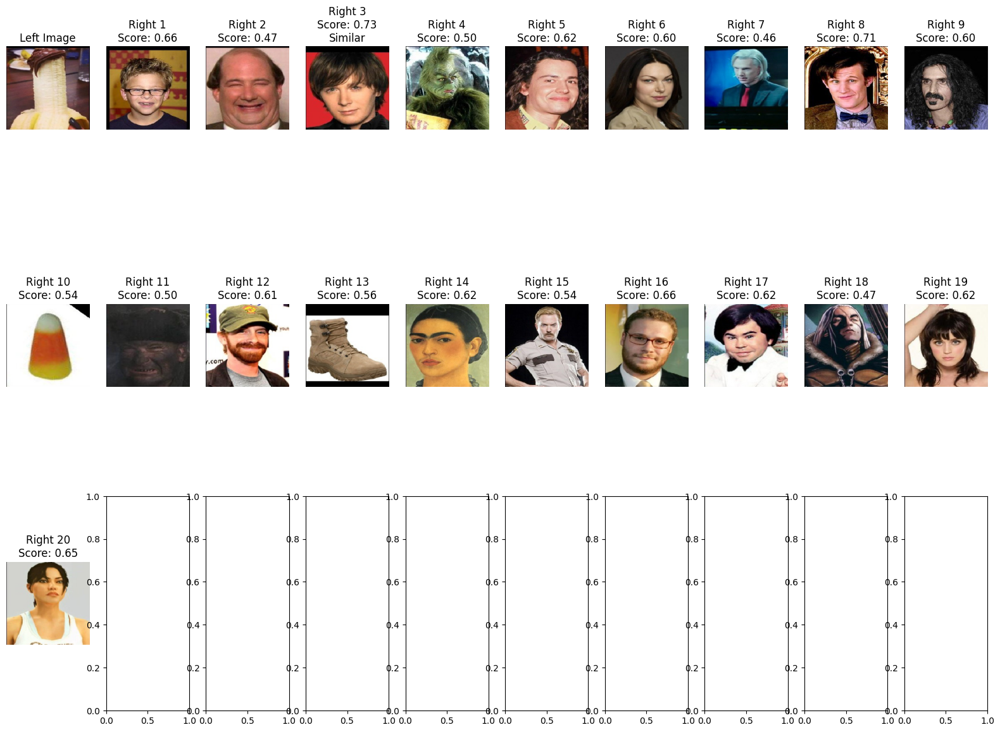

Similarity Scores: [0.59413147 0.6118907  0.39019275 0.54794216 0.65872943 0.7065722
 0.4250793  0.63089335 0.435026   0.5883745  0.6179575  0.43172708
 0.571383   0.45358315 0.4201993  0.55211616 0.42153996 0.64823484
 0.58625495 0.6919391 ]


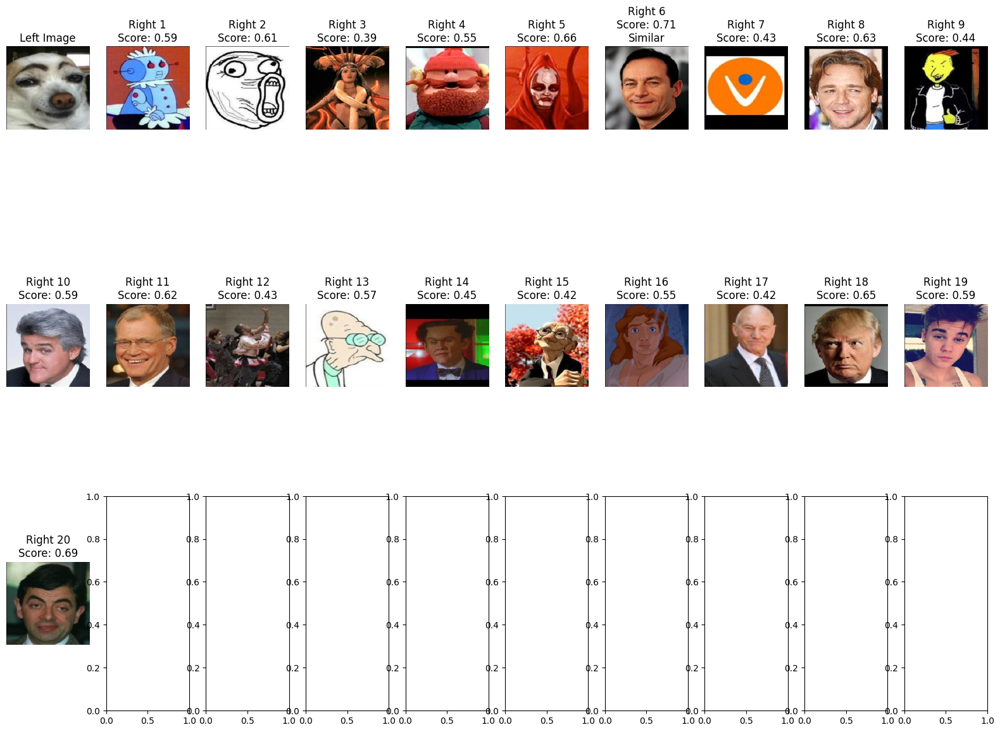

Similarity Scores: [0.5228109  0.41190663 0.5079287  0.5947492  0.4822843  0.6152463
 0.3962919  0.6120513  0.5854671  0.58776486 0.5293695  0.41831186
 0.39623606 0.48087615 0.44668648 0.51366466 0.52358687 0.4404531
 0.4946053  0.4320566 ]


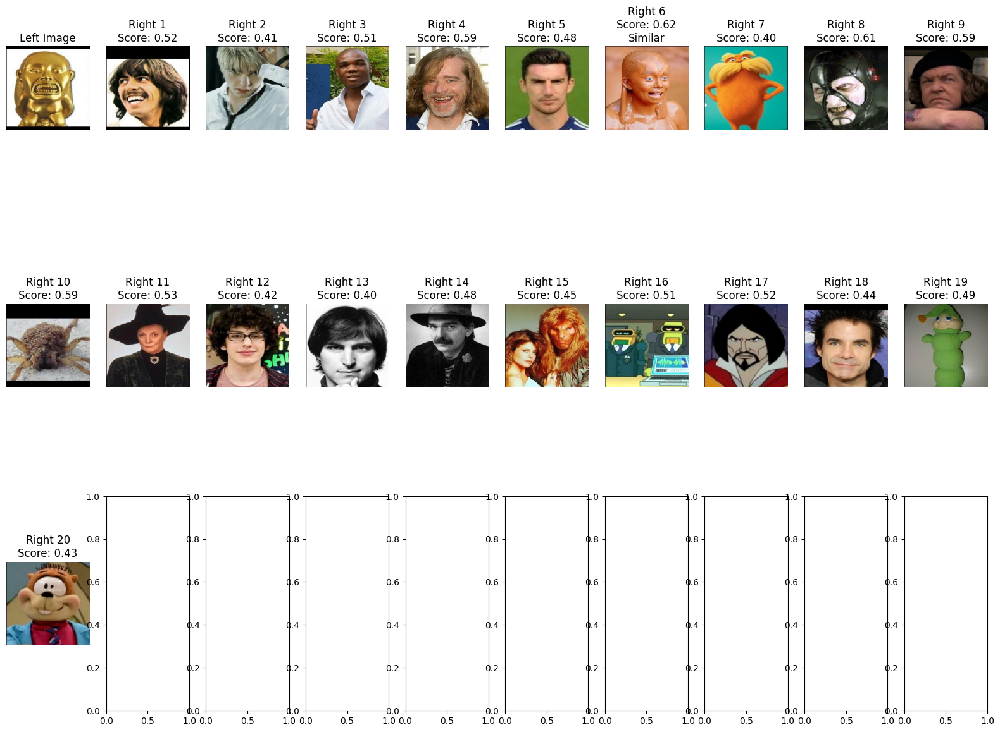

Similarity Scores: [0.61566234 0.7753279  0.68579197 0.65408343 0.6990748  0.66525936
 0.37296498 0.59195906 0.5480045  0.3946042  0.7089045  0.44033456
 0.6821539  0.61341166 0.596148   0.56511414 0.55271345 0.6767074
 0.5905174  0.49219874]


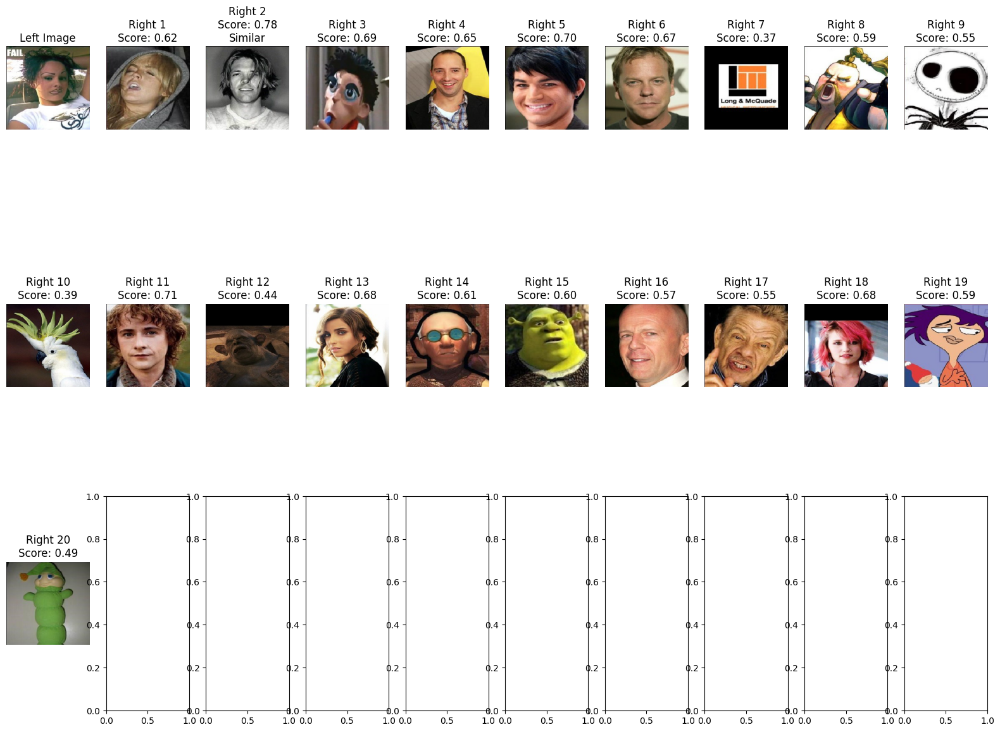

Similarity Scores: [0.5083132  0.7603786  0.6578307  0.5111949  0.68877125 0.49122512
 0.49565852 0.66292924 0.5159226  0.6209534  0.5970285  0.6083585
 0.42679545 0.6675409  0.5611157  0.6314614  0.4246784  0.74396676
 0.40563878 0.45163152]


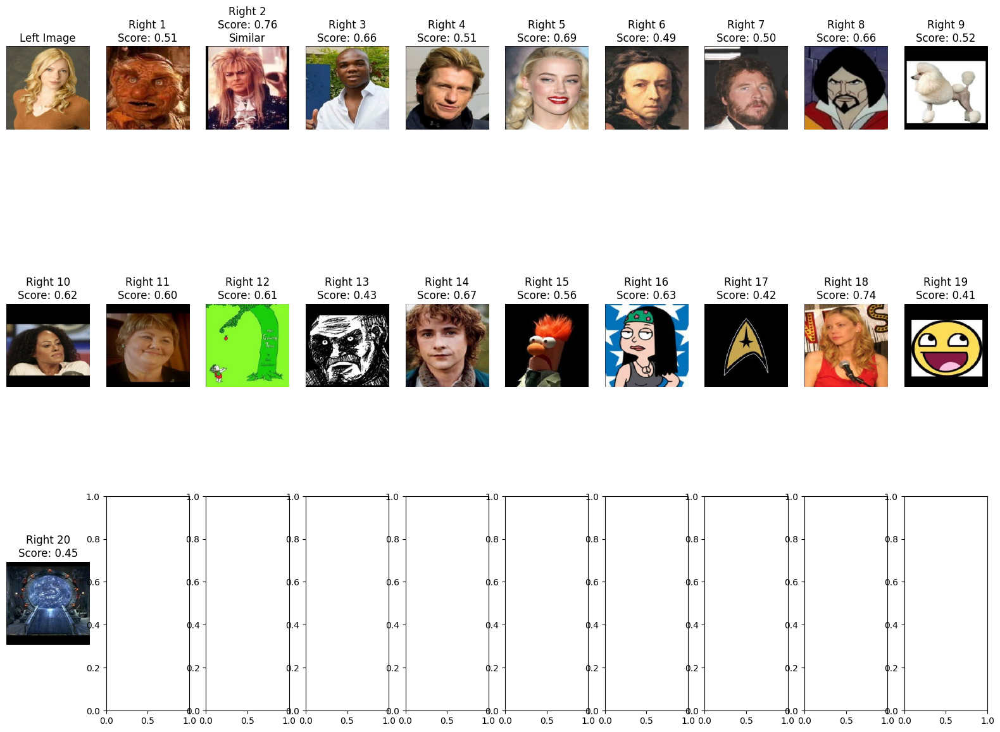

Similarity Scores: [0.7548027  0.50280625 0.45467874 0.60589266 0.41593862 0.47745556
 0.5775532  0.4262038  0.33394462 0.4816217  0.48452073 0.5462445
 0.45314404 0.7952712  0.5443542  0.71837825 0.715917   0.6042775
 0.7488282  0.47565493]


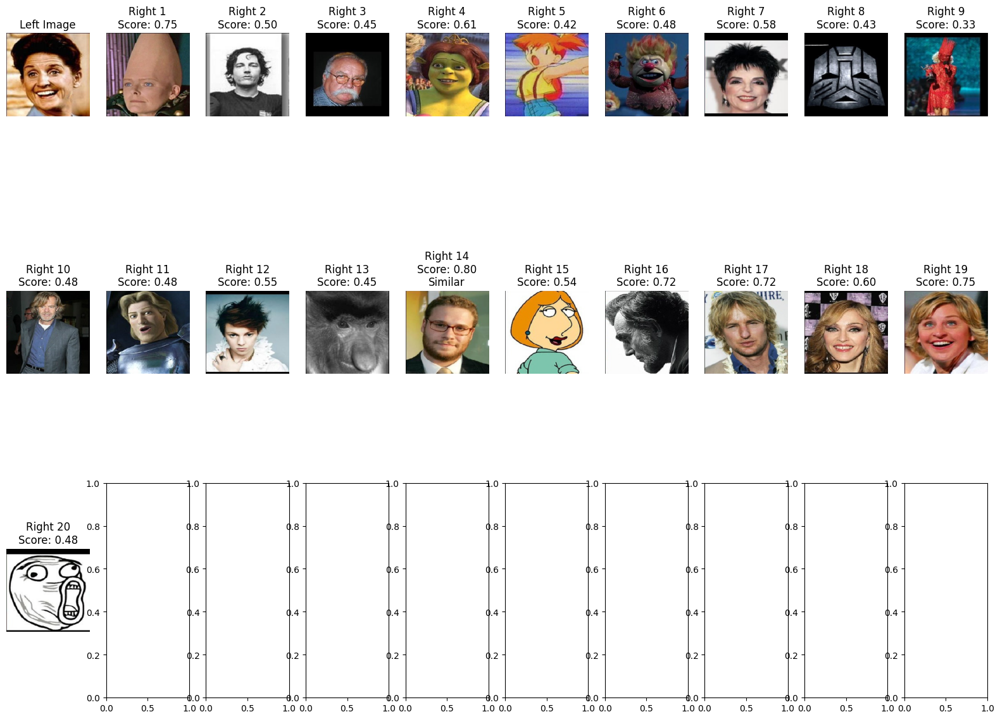

Similarity Scores: [0.52983916 0.4701009  0.43201333 0.4012267  0.5351091  0.59732354
 0.56331354 0.5859803  0.5543289  0.54568917 0.46708077 0.5298175
 0.5919765  0.5554451  0.5458457  0.41583222 0.5630813  0.55768394
 0.5622091  0.4452019 ]


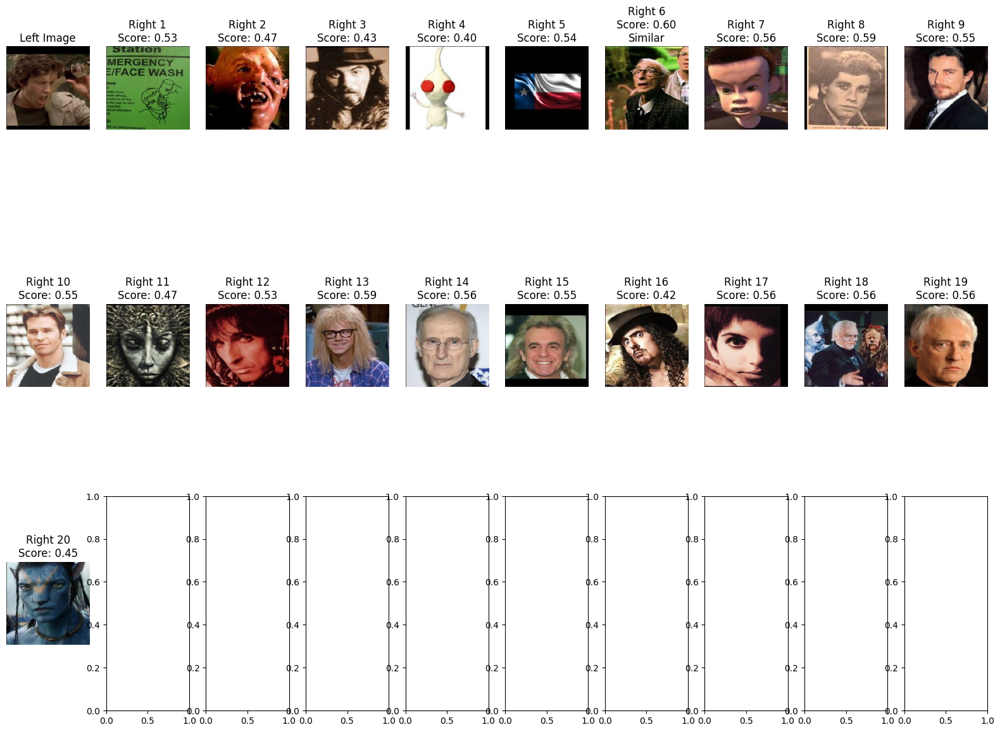

Similarity Scores: [0.5695668  0.64436316 0.5160345  0.60369873 0.68404037 0.60443
 0.58329314 0.6394403  0.57382685 0.50613666 0.59007454 0.5155233
 0.49430445 0.50945604 0.60240453 0.5890064  0.550598   0.37083304
 0.5783283  0.6052391 ]


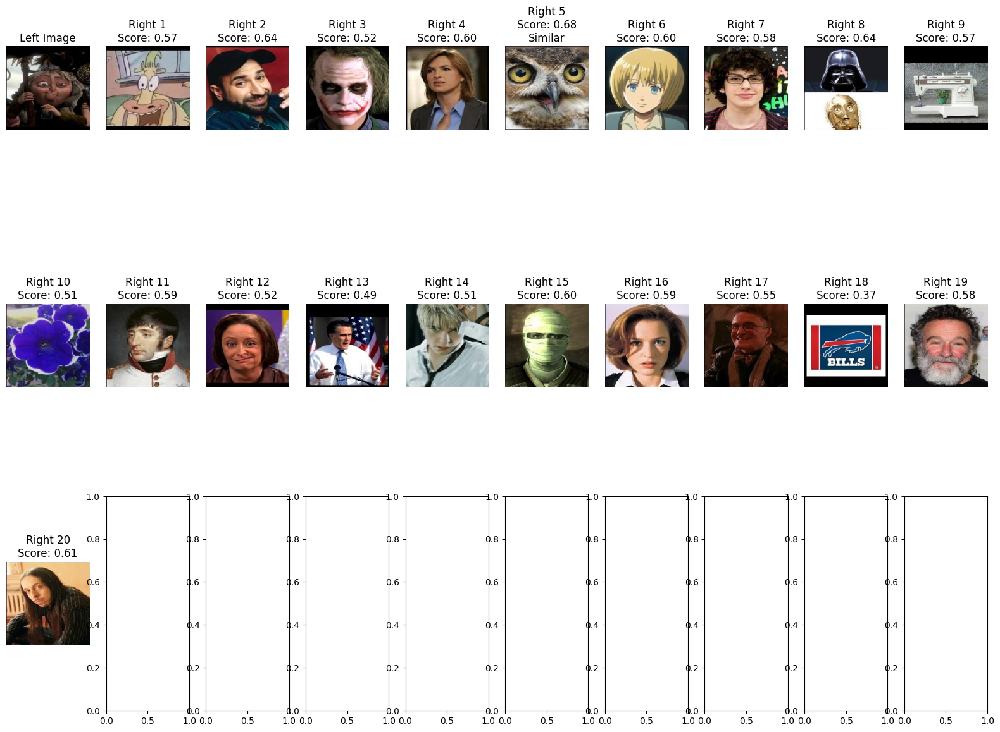

Similarity Scores: [0.88690066 0.41370568 0.68195045 0.60301554 0.69654906 0.5649703
 0.71394813 0.46490473 0.3492222  0.40850806 0.6846591  0.5400745
 0.49473783 0.44211453 0.67771685 0.6405657  0.5495652  0.5499779
 0.64292055 0.8771355 ]


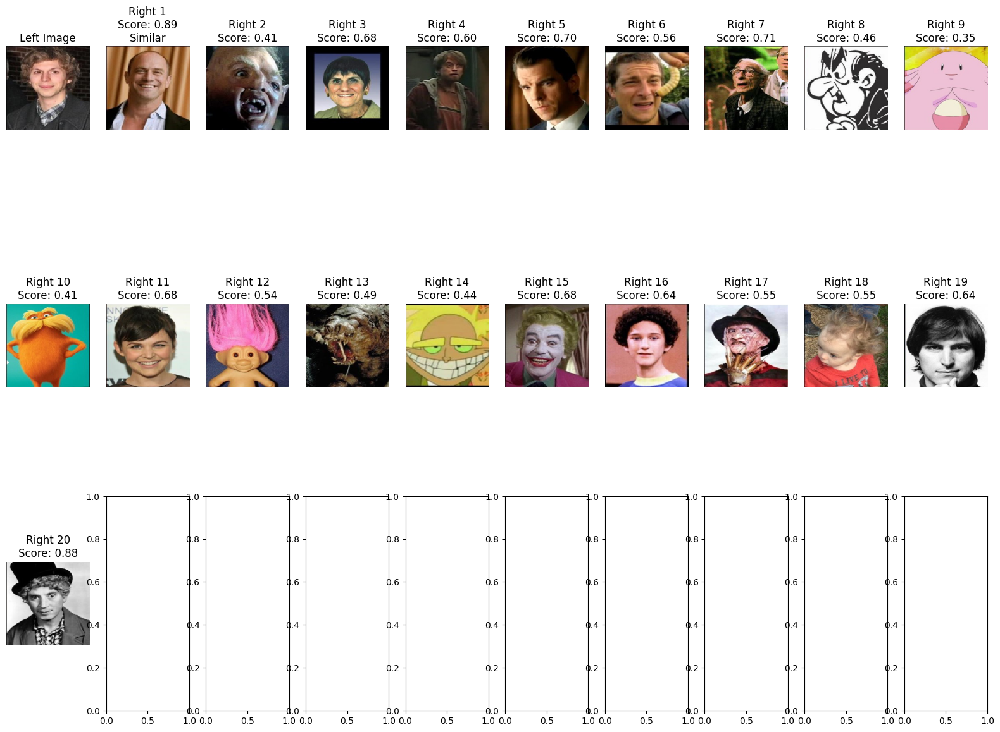

In [ ]:
show_test_case(siamese_model, test_candidates_df, row_number=10)

In [ ]:
output_df = pd.DataFrame(columns=["left", "c0", "c1", "c2", "c3", "c4", "c5", "c6", "c7", "c8", "c9", "c10", "c11", "c12", "c13", "c14", "c15", "c16", "c17", "c18", "c19"])
print(get_test_result(siamese_model, test_candidates_df,output_df, "ResNet50_before_transfer.csv"))

Row 0


2023-10-01 04:48:58.830761: I tensorflow/core/tpu/graph_rewrite/encapsulate_tpu_computations_pass.cc:238] Subgraph fingerprint:9098872261938960900
2023-10-01 04:49:04.163983: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-10-01 04:49:06.274760: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


Row 1
Row 2
Row 3
Row 4
Row 5
Row 6
Row 7
Row 8
Row 9
Row 10
Row 11
Row 12
Row 13
Row 14
Row 15
Row 16
Row 17
Row 18
Row 19
Row 20
Row 21
Row 22
Row 23
Row 24
Row 25
Row 26
Row 27
Row 28
Row 29
Row 30
Row 31
Row 32
Row 33
Row 34
Row 35
Row 36
Row 37
Row 38
Row 39
Row 40
Row 41
Row 42
Row 43
Row 44
Row 45
Row 46
Row 47
Row 48
Row 49
Row 50
Row 51
Row 52
Row 53
Row 54
Row 55
Row 56
Row 57
Row 58
Row 59
Row 60
Row 61
Row 62
Row 63
Row 64
Row 65
Row 66
Row 67
Row 68
Row 69
Row 70
Row 71
Row 72
Row 73
Row 74
Row 75
Row 76
Row 77
Row 78
Row 79
Row 80
Row 81
Row 82
Row 83
Row 84
Row 85
Row 86
Row 87
Row 88
Row 89
Row 90
Row 91
Row 92
Row 93
Row 94
Row 95
Row 96
Row 97
Row 98
Row 99
Row 100
Row 101
Row 102
Row 103
Row 104
Row 105
Row 106
Row 107
Row 108
Row 109
Row 110
Row 111
Row 112
Row 113
Row 114
Row 115
Row 116
Row 117
Row 118
Row 119
Row 120
Row 121
Row 122
Row 123
Row 124
Row 125
Row 126
Row 127
Row 128
Row 129
Row 130
Row 131
Row 132
Row 133
Row 134
Row 135
Row 136
Row 137
Row 138
Row 